In [27]:
import torch as torch
import numpy as np
from scipy.io import loadmat
import pdb
import os
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import json

import matplotlib.pyplot as plt
from matplotlib import cm, colors

import sys
import ipyvolume as ipv
sys.path.append("..")
from Projection_Client import Projection_Client

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Joints

In [28]:
original_joint_names_dataset = ['neck', 'head', 'spine',  'left_shoulder',  'left_elbow',
                                'left_hand', 'left_hip', 'left_knee', 'left_foot', 
                                'right_shoulder','right_elbow','right_hand',
                                'right_hip','right_knee','right_foot', 'right_eye', 
                                'left_eye', 'right_ear', 'left_ear']

orijinal_joint_num = 19
joint_indices_dataset = list(range(orijinal_joint_num))

joint_names_mpi = ['head','neck','right_shoulder','right_elbow','right_hand',
                'left_shoulder', 'left_elbow','left_hand','right_hip','right_knee', 
                'right_foot', 'left_hip', 'left_knee', 'left_foot', 'spine']

bones_mpi = [[0, 1], [14, 1], #middle
            [1, 2], [2, 3], [3, 4], #right arm
            [1, 5], [5, 6], [6, 7],  #left arm
            [14, 8], [8, 9], [9, 10], #right leg
            [14, 11], [11, 12], [12, 13]] #left leg


def find_bone_map():
    joint_map = []
    for ind, value in enumerate(joint_names_mpi):
        joint_map.append(original_joint_names_dataset.index(value))
    return joint_map
mpi_joint_map = find_bone_map()

def rearrange_bones_to_mpi(joints_unarranged, joint_map):
    joints_rearranged = np.zeros([3,15])
    joints_rearranged = joints_unarranged[:, joint_map]
    return joints_rearranged

## Parsing Util Functions

In [29]:
def get_stripped_word_list(file_name):
    line = file_name.readline()
    word_list = line.split()
    stripped_word_list = [word.strip() for word in word_list]
    first_word = stripped_word_list[0]
    return first_word, stripped_word_list

## Plotting Functions

In [30]:
def display_pose(pose):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111,  projection='3d')
    X = pose[0,:]
    Y = pose[1,:]
    Z = pose[2,:]
    for _, bone in enumerate(bones_mpi):
        ax.plot(X[bone], Y[bone], Z[bone], c='xkcd:black')

    max_range = np.array([X.max()-X.min(), Y.max()-Y.min(), Z.max()-Z.min()]).max() *0.4
    mid_x = (X.max()+X.min()) * 0.5
    mid_y = (Y.max()+Y.min()) * 0.5
    mid_z = (Z.max()+Z.min()) * 0.5
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    plt.show()
    plt.close(fig)

In [31]:
def read_image(dataset_loc, camera, frame):
    image_dir = dataset_loc + "/camera_{:d}/img_{:d}.jpg".format(camera, frame)
    image = plt.imread(image_dir)
    return image

def plot_for_all_views_proj(dataset_loc, frame, proj):
    fig = plt.figure(figsize=(50,100))
    for camera_ind in range(num_cameras):
        ax = fig.add_subplot(8,4,int(camera_ind+1))
        image = read_image(dataset_loc, camera_ind, frame)
        ax.imshow(image)
        for i, bone in enumerate(bones_mpi):    
            ax.plot(proj[camera_ind, 0, bone], proj[camera_ind, 1, bone], color = "w", linewidth=1)   


In [32]:
def plot_all_camera_pos(tranformation_matrix_all, pose=None):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111,  projection='3d')

    X, Y, Z = [], [], []
    if pose is not None:
        X = pose[0,:].tolist()
        Y = pose[1,:].tolist()
        Z = pose[2,:].tolist()
        for _, bone in enumerate(bones_mpi):
            ax.plot(pose[0,bone], pose[1,bone], pose[2,bone], c='xkcd:black')

    for camera_ind in range(tranformation_matrix_all.shape[0]-3):
        transformation_matrix = tranformation_matrix_all[camera_ind, :, :]
        C_drone = transformation_matrix[0:3, 3]
       # C_drone[2] = C_drone[2] 
        R_drone = transformation_matrix[0:3, 0:3]
        axis1 = R_drone[:,2].unsqueeze(1)# @torch.t(torch.FloatTensor([[0,0,1]]))
        axis2 = R_drone[:,1].unsqueeze(1)#@torch.t(torch.FloatTensor([[0,1,0]]))
        axis3 = R_drone[:,0].unsqueeze(1)#@torch.t(torch.FloatTensor([[1,0,0]]))

        axis1 = 1*axis1/torch.norm(axis1)
        axis2 = 1*axis2/torch.norm(axis2)
        axis3 = 1*axis3/torch.norm(axis3)

        ax.scatter(C_drone[0], C_drone[1], C_drone[2], c='xkcd:pink')
        p1, = ax.plot([C_drone[0], C_drone[0]+axis1[0,0]], [C_drone[1], C_drone[1]+axis1[1,0]], [C_drone[2], C_drone[2]+axis1[2,0]], c='xkcd:red', label="forward")
        p2, = ax.plot([C_drone[0], C_drone[0]-axis2[0,0]], [C_drone[1], C_drone[1]-axis2[1,0]], [C_drone[2], C_drone[2]-axis2[2,0]], c='xkcd:blue', label="up")
        p3, = ax.plot([C_drone[0], C_drone[0]+axis3[0,0]], [C_drone[1], C_drone[1]+axis3[1,0]], [C_drone[2], C_drone[2]+axis3[2,0]], c='xkcd:green', label="right")
        ax.text(C_drone[0], C_drone[1], C_drone[2], str(camera_ind))

        X.append(C_drone[0])
        Y.append(C_drone[1])
        Z.append(C_drone[2])

#         ax.legend([p1, p2, p3])

    X = np.array(X)
    Y = np.array(Y)
    Z = np.array(Z)

    max_range = np.array([X.max()-X.min(), Y.max()-Y.min(), Z.max()-Z.min()]).max() *0.4
    mid_x = (X.max()+X.min()) * 0.5
    mid_y = (Y.max()+Y.min()) * 0.5
    mid_z = (Z.max()+Z.min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    #ax.view_init(elev=30., azim=135)
    #plt.show()
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    ax.view_init(elev=30., azim=135)
    plt.savefig("cmu_dataset.pdf")
  #  plt.show()
  #  plt.show()
   # plt.close(fig)

## Process Dataset

In [33]:
main_loc = "/Users/kicirogl/workspace/cvlabsrc1/cvlab/datasets_cmu_panoptic/panoptic-toolbox"
seq_name = "171204_pose1"
seq_loc = main_loc + "/" + seq_name
new_dataset_loc = "/Users/kicirogl/workspace/cvlabsrc1/home/kicirogl/ActiveDrone/test_sets/cmu_panoptic_pose_1"


test_set_name = "cmu_panoptic_pose_1"

gt_files_loc = seq_loc + "/hdPose3d_stage1_coco19"

start_time = 34
end_time = 34+25
fps = 30
start_frame = fps * start_time
delta_t = 0.1

joint_num = 15
seq_len = 250

num_cameras = 31

In [38]:
def put_poses_in_matrix(overwrite=True):
    if overwrite:
        saved_gt_file = open(new_dataset_loc+"/gt_3d_poses.txt", "w")
        saved_gt_file.write("linecount\tanim_time\tpose\n")

    pose_matrix = np.zeros([seq_len, 3, joint_num])
    anim_time = start_time
    linecount = 1
    first_word = ""
    frame = start_frame
    for _ in range(seq_len):
        json_file_name = gt_files_loc+"/body3DScene_{0:08d}.json".format(int(frame))
        with open(json_file_name) as json_file:
            body_pose_dict = json.load(json_file)
        
        bodies_dict = body_pose_dict["bodies"]
        body_dict = bodies_dict[0]
        joint_locations = body_dict["joints19"]
                
        joints_unarranged = np.array(joint_locations).reshape(-1, 4).transpose()[0:3,:]
        rearranged_pose = rearrange_bones_to_mpi(joints_unarranged, mpi_joint_map)
        pose_matrix[linecount-1] = rearranged_pose.copy()
        if overwrite:
            pose_str = str(linecount) + "\t" + str(anim_time) + "\t"
            for i in range(rearranged_pose.shape[1]):
                pose_str += str(rearranged_pose[0, i]) + '\t' + str(rearranged_pose[1, i]) + '\t' + str(rearranged_pose[2, i]) + '\t' 
            saved_gt_file.write(pose_str + "\n")
        
        #update anim_time and linecount
        linecount += 1
        anim_time += delta_t
        frame = anim_time*fps
        
    return pose_matrix
    

In [39]:
pose_matrix = put_poses_in_matrix(overwrite=True)

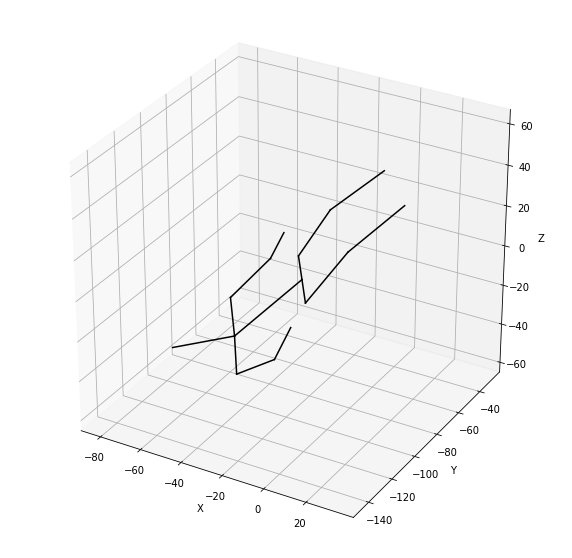

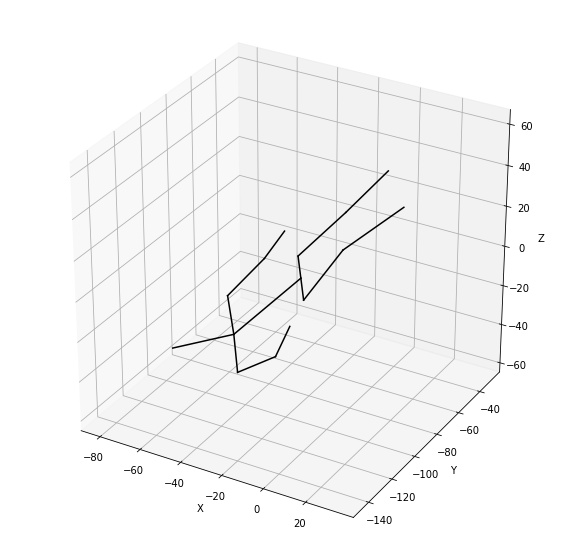

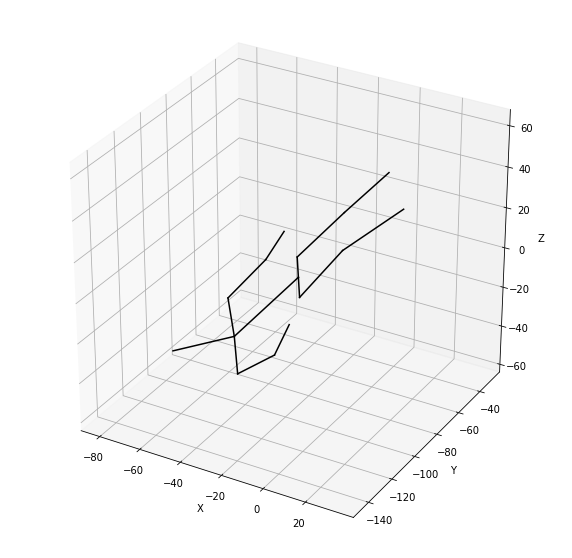

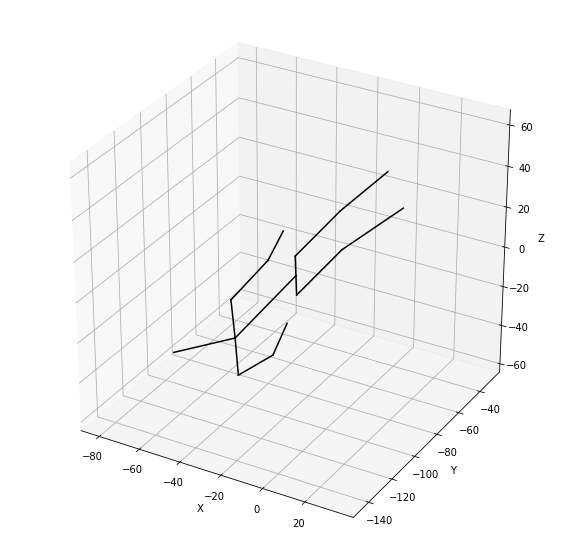

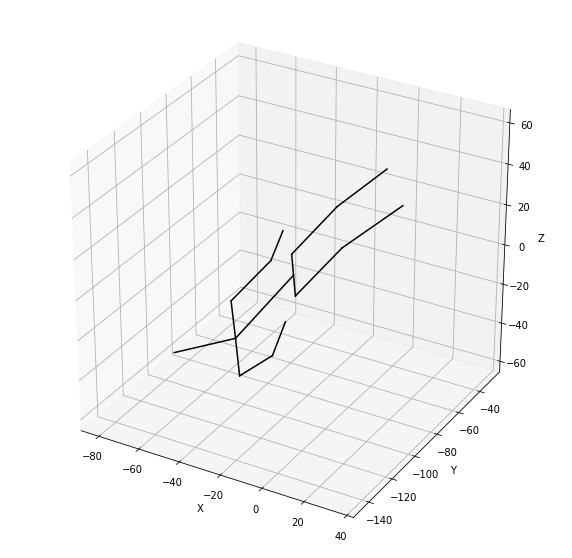

In [40]:
for pose_ind in range(5):
    display_pose(pose_matrix[pose_ind])

In [41]:
def load_cameras( data_path, seq_name ):
    """Load the camera calibration file for a given sequence"""

    # Load camera calibration file
    with open(data_path+'/calibration_{0}.json'.format(seq_name)) as cfile:
        calib = json.load(cfile)

    # Cameras are identified by a tuple of (panel#,node#)
    cameras = {(cam['panel'],cam['node']):cam for cam in calib['cameras']}

    # Convert data into numpy arrays for convenience
    for k,cam in cameras.items():
        cam['K'] = np.matrix(cam['K'])
        cam['distCoef'] = np.array(cam['distCoef'])
        cam['R'] = np.matrix(cam['R'])
        cam['t'] = np.array(cam['t']).reshape((3,1))
        cam['size_x'] = np.array(cam['resolution'])[0]
        cam['size_y'] = np.array(cam['resolution'])[1]

    return cameras

In [42]:
def save_intrinsics():
    cameras = load_cameras(seq_loc, seq_name)
    for key, data in cameras.items():
        if key[0] == 0:
            json_file_name = new_dataset_loc+"/camera_"+str(key[1])+"/intrinsics.json"
            intrinsics_dict = {}
            intrinsics_dict['size_x'] = int(data['size_x'])
            intrinsics_dict['size_y'] = int(data['size_y'])
            intrinsics_dict['K'] = np.array(data['K'] ).tolist() 
            with open(json_file_name, 'w') as json_file:
                json.dump(intrinsics_dict, json_file)

In [43]:
 save_intrinsics()

In [50]:
def save_extrinsics():
    cameras = load_cameras(seq_loc, seq_name)
    for key, data in cameras.items():
        if key[0] == 0:
            json_file_name = new_dataset_loc+"/camera_"+str(key[1])+"/extrinsics.json"
            extrinsics = np.concatenate([data['R'], data['t']], axis=1)
            extrinsics = np.concatenate([extrinsics, np.array([[0,0,0,1]])], axis=0)
            extrinsics = np.linalg.inv(extrinsics)
            extrinsics_dict = {}
            extrinsics_dict['extrinsics_matrix'] = extrinsics.tolist() 
            with open(json_file_name, 'w') as json_file:
                json.dump(extrinsics_dict, json_file)

In [51]:
save_extrinsics()

## Test functions

In [53]:

f_extrinsics_dict = {}
for cam_index in range(num_cameras):
    f_extrinsics_dict[cam_index] = new_dataset_loc + "/camera_" + str(cam_index) + "/extrinsics.json"
    
transformation_matrix_tensor = torch.zeros([num_cameras, 4, 4])
inv_transformation_matrix_tensor = torch.zeros([num_cameras, 4, 4])


for cam_index in range(num_cameras):
    f_extrinsics = f_extrinsics_dict[cam_index]
    with open(f_extrinsics) as json_file:
        extrinsics_dict = json.load(json_file)
        transformation_matrix_tensor[cam_index, :, :] = torch.FloatTensor(extrinsics_dict["extrinsics_matrix"])
        inv_transformation_matrix_tensor[cam_index, :, :] = torch.inverse(transformation_matrix_tensor[cam_index, :,:] )


In [54]:
f_intrinsics_dict = {}
for cam_index in range(num_cameras):
    f_intrinsics_dict[cam_index] = new_dataset_loc + "/camera_" + str(cam_index) + "/intrinsics.json"

def read_intrinsics(f_intrinsics_dict):
    assert f_intrinsics_dict is not None

    intrinsics = {}
    K_torch = torch.zeros([num_cameras, 3, 3])

    for cam_index in range(num_cameras):
        f_intrinsics = f_intrinsics_dict[cam_index]
        with open(f_intrinsics) as json_file:
            intrinsics_dict = json.load(json_file)
            K_torch[cam_index, :, :] = torch.FloatTensor(intrinsics_dict["K"])
            #all image sizes are uniform in this dataset
            size_x = intrinsics_dict["size_x"] 
            size_y = intrinsics_dict["size_y"]
            #since this dataset does not provide focal length
            #and focal length is found at [0,0] and [1,1] we take their average.
            #projection does not use this value (it uses K directly)
            #but back-projection does!
            intrinsics[cam_index] = {}
            intrinsics[cam_index]["f"] = (K_torch[cam_index, 0,0] + K_torch[cam_index, 1,1])/2
    intrinsics["size_x"] = size_x
    intrinsics["size_y"] = size_y
    intrinsics["K_torch"] = K_torch
    intrinsics["flip_x_y"] = torch.eye(3)
    return intrinsics

intrinsics = read_intrinsics(f_intrinsics_dict)

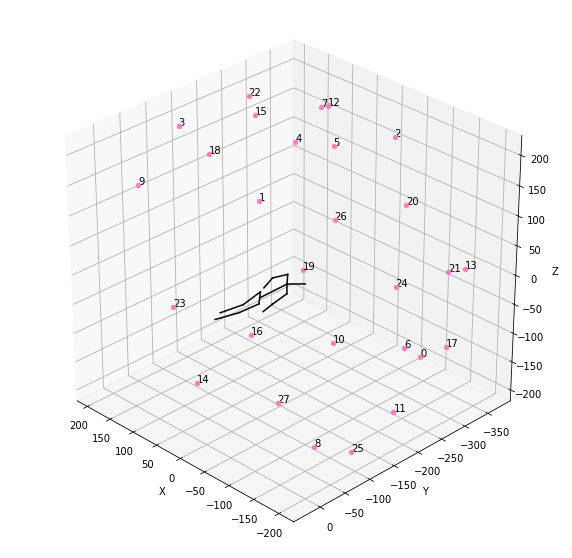

In [55]:
new_pose_matrix = pose_matrix
plot_all_camera_pos(transformation_matrix_tensor, pose=new_pose_matrix[0])

In [56]:
projection_client = Projection_Client(test_set="cmu_panoptic_pose_1", future_window_size=0, estimation_window_size=1, num_of_joints=15, 
                    intrinsics=intrinsics, device=torch.device("cpu"))  

In [57]:
def take_projection(projection_client, P_world, inv_transformation_matrix):
    P_world = torch.from_numpy(P_world).float()
    ones_tensor = torch.ones(num_cameras, 1, 15)*1.0
    expanded_P_world = P_world.unsqueeze(0).repeat(num_cameras, 1, 1)
    flip_x_y_single = torch.eye(3)
    flip_x_y = torch.cat((flip_x_y_single, torch.zeros(3,1)), dim=1).unsqueeze(0).repeat(num_cameras,1,1)    
    projection_result = projection_client.take_batch_projection(expanded_P_world, inv_transformation_matrix, ones_tensor, projection_client.K_torch, flip_x_y)
    return projection_result

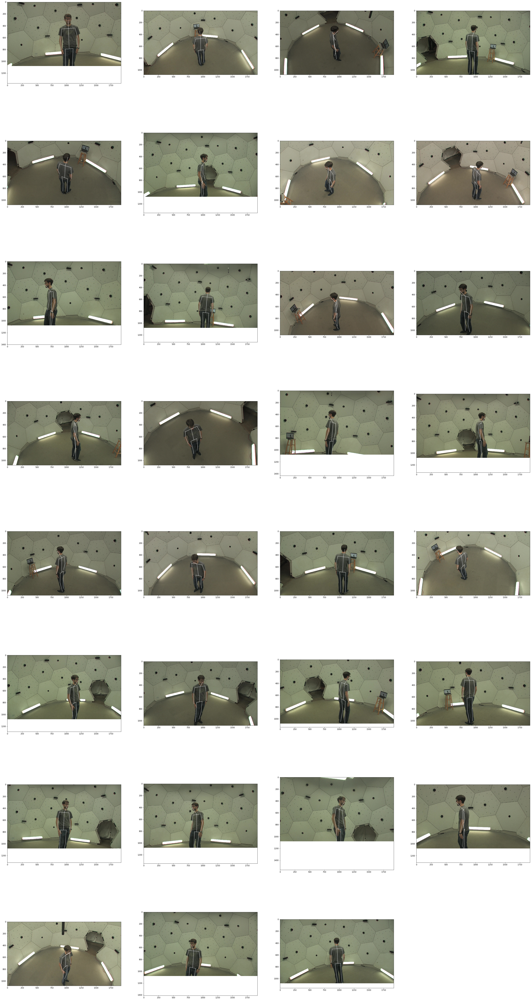

In [59]:
frame = 1
proj = take_projection(projection_client, new_pose_matrix[frame], inv_transformation_matrix_tensor)
plot_for_all_views_proj(new_dataset_loc, frame, (proj).numpy())